# Question 1

## Task 1

In [39]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [40]:
'''
Asked GPT for the code by giving it the prompt

Implement Kernel Density Estimation (KDE). Your KDE should include the
following functions
• allows selection from the following kernels: box, gaussian, triangular
• fit data
• select appropriate bandwidth using the pseudo-likelihood method
• evaluate the density given an input x
• visualize the data and the estimated pdf. For this you can assume that
the function will be used only when input dataset is 1-D or 2-D.
'''

'\nAsked GPT for the code by giving it the prompt\n\nImplement Kernel Density Estimation (KDE). Your KDE should include the\nfollowing functions\n• allows selection from the following kernels: box, gaussian, triangular\n• fit data\n• select appropriate bandwidth using the pseudo-likelihood method\n• evaluate the density given an input x\n• visualize the data and the estimated pdf. For this you can assume that\nthe function will be used only when input dataset is 1-D or 2-D.\n'

In [112]:
from scipy.optimize import minimize

class KernelDensityEstimation:
    def __init__(self, kernel='gaussian'):
        self.kernel = kernel

    def pseudo_likelihood(self, bandwidth):
        density = np.zeros(len(self.data))
        for i, xi in enumerate(self.data):
            try:
                density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth ** self.data.shape[1])
            except:
                density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth)
            # NOTE: we don't divide by num samples as we have already taken the mean        pse_like = np.mean(np.log(density, where=density > 0))

        pse_like = np.mean(np.log(density, where=density > 0))

        return -pse_like

    def select_bandwidth(self, data):
        # Bandwidth selection using pseudo-likelihood method
        n = len(data)
        if self.kernel == 'gaussian':
            initial_estimate = (4 / (3 * n)) ** 0.2 * np.std(data)
        elif self.kernel == 'box':
            initial_estimate = (4 / (3 * n)) ** 0.2 * np.std(data)
        elif self.kernel == 'triangular':
            initial_estimate = (6 / (n * (n + 1))) ** 0.25 * np.std(data)
            # not the one given by sir, but still valid
        opt = minimize(self.pseudo_likelihood, initial_estimate, bounds=((0.9*initial_estimate, 1.1*initial_estimate),))
        self.bandwidth = opt.x[0]

    def kernel_function(self, x):
        if self.kernel == 'gaussian':
            return self.gauss(x)
        elif self.kernel == 'box':
            return self.box(x)
        elif self.kernel == 'triangular':
            return self.triang(x)
        
    def gauss(self, x):
        if len(self.data.shape) == 1:
            return np.exp(-0.5 * x ** 2) / np.sqrt(2 * np.pi)
        else:
            return np.exp(-0.5 * (x @ x.T)) / np.power(2 * np.pi, self.data.shape[1]/2)

    def box(self,x):
        return 0.5 * np.where(np.abs(x) <= 1, 1, 0)
        # no cases for >1 dim as numpy's handling it - see visualization

    def triang(self, x):
        if len(self.data.shape) == 1:
            return np.maximum(1 - np.abs(x), 0)
        else:
            return np.where(np.all(x < 1, axis=-1), np.prod(np.ones_like(x) - x, axis=-1), 0.)

    def fit(self, data, bandwith = None):
        self.data = data
        if bandwith is None:
            self.select_bandwidth(data)
        else:
            self.bandwidth = bandwith
        

    def evaluate_density(self, x):
        density = np.zeros(len(x))
        for i, xi in enumerate(x):
            try:
                density[i] = np.mean(self.kernel_function((xi - self.data) / self.bandwidth)) / (self.bandwidth ** self.data.shape[1])
            except:
                density[i] = np.mean(self.kernel_function((xi - self.data) / self.bandwidth)) / (self.bandwidth)
            # NOTE: we don't divide by num samples as we have already taken the mean
        try:
            return density.reshape(-1, len(x[0]))
        except:
            return density

    def visualize_pdf(self, data):
        if len(data.shape) == 1:  # 1D data
            x = np.linspace(min(data), max(data), 1000)
            density = self.evaluate_density(x)

            plt.figure(figsize=(8, 6))
            plt.hist(data, bins=30, density=True, alpha=0.5)
            plt.plot(x, density, label='Estimated PDF')
            plt.title('Kernel Density Estimation - 1D')
            plt.legend()
            plt.show()

        else:  # 2D data
            x, y = np.meshgrid(np.linspace(min(data[:, 0]), max(data[:, 0]), 100),
                               np.linspace(min(data[:, 1]), max(data[:, 1]), 100))
            points = np.vstack([x.ravel(), y.ravel()]).T
            density = self.evaluate_density(points)

            plt.figure(figsize=(8, 6))
            plt.scatter(data[:, 0], data[:, 1], alpha=0.5, label='Data Points')
            plt.contourf(x, y, density.reshape(x.shape), alpha=0.5, cmap='viridis')
            plt.title('Kernel Density Estimation - 2D')
            plt.legend()
            plt.colorbar()
            plt.show()



0.3429369285599983


/tmp/ipykernel_1326370/1697895617.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth)


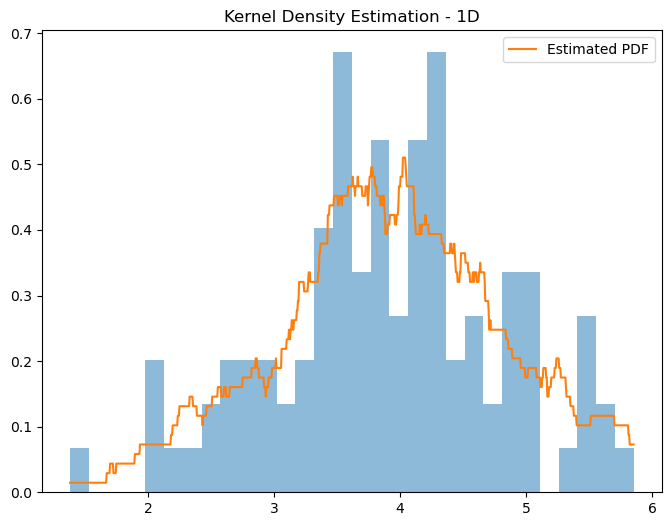

2


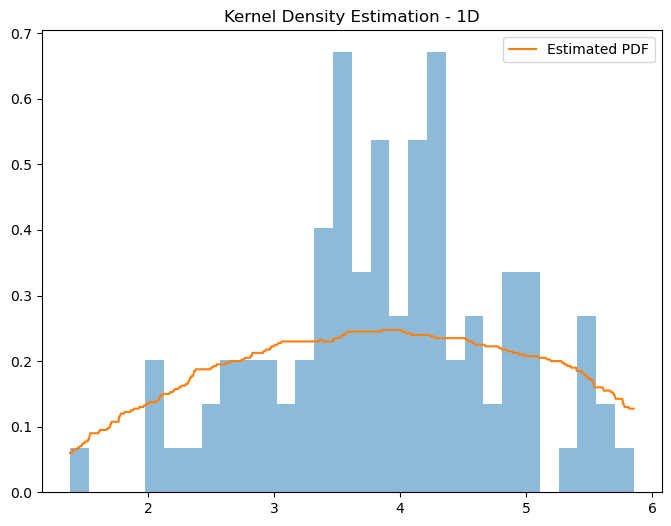

In [113]:

# Example usage:
# Generate sample data
np.random.seed(42)
data_1d = np.random.normal(loc=4, scale=1, size=100)
data_2d = np.random.multivariate_normal(mean=[0, 0], cov=[[1, 0.5], [0.5, 1]], size=100)

# Create KDE object
kde = KernelDensityEstimation(kernel='box')

# Fit the data
kde.fit(data_1d)
print(kde.bandwidth)
kde.visualize_pdf(data_1d)

# Create KDE object
kde = KernelDensityEstimation(kernel='box')

# Fit the data
kde.fit(data_1d, bandwith=2)
print(kde.bandwidth)
kde.visualize_pdf(data_1d)

/tmp/ipykernel_1326370/1697895617.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth)


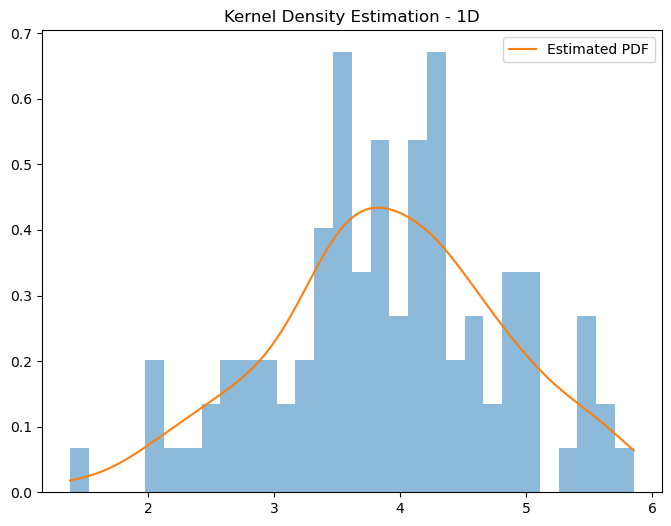

/tmp/ipykernel_1326370/1697895617.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth ** self.data.shape[1])


0.3429369285599983


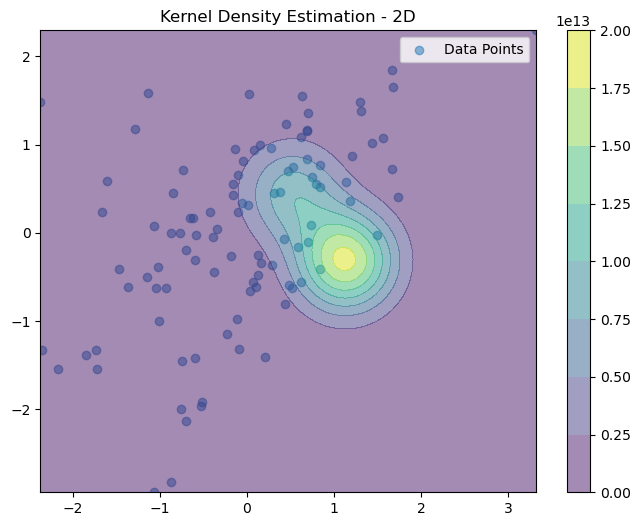

In [114]:

# Create KDE object
kde = KernelDensityEstimation(kernel='gaussian')

# Fit the data
kde.fit(data_1d)
kde.visualize_pdf(data_1d)

print(kde.bandwidth)

# Fit 2D data
kde.fit(data_2d)
kde.visualize_pdf(data_2d)

/tmp/ipykernel_1326370/1697895617.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth)


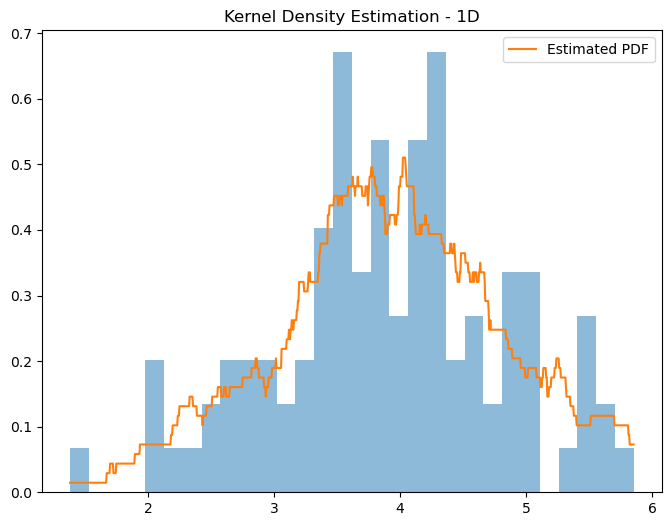

/tmp/ipykernel_1326370/1697895617.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  density[i] = np.mean(self.kernel_function((xi - self.data) / bandwidth)) / (bandwidth ** self.data.shape[1])


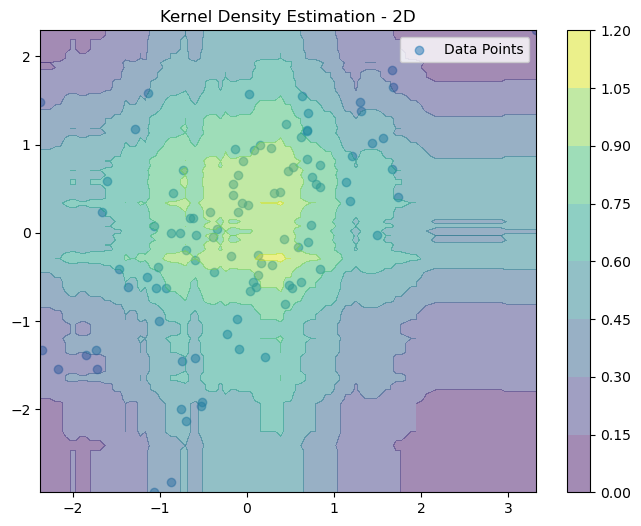

In [115]:
# Create KDE object
kde = KernelDensityEstimation(kernel='box')

# Fit the data
kde.fit(data_1d)
kde.visualize_pdf(data_1d)

# Fit 2D data
kde.fit(data_2d)
kde.visualize_pdf(data_2d)

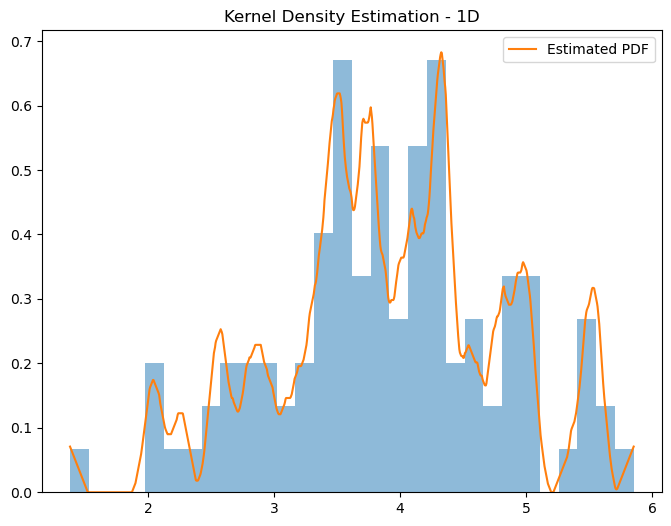

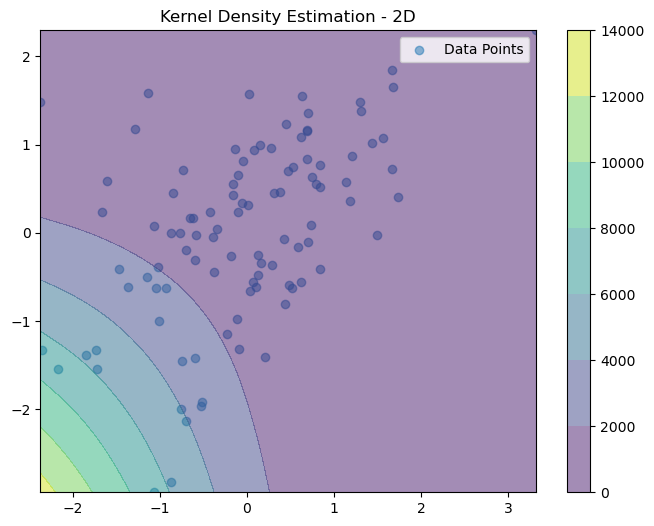

In [79]:
# Create KDE object
kde = KernelDensityEstimation(kernel='triangular')

# Fit the data
kde.fit(data_1d)
kde.visualize_pdf(data_1d)

# Fit 2D data
kde.fit(data_2d)
kde.visualize_pdf(data_2d)

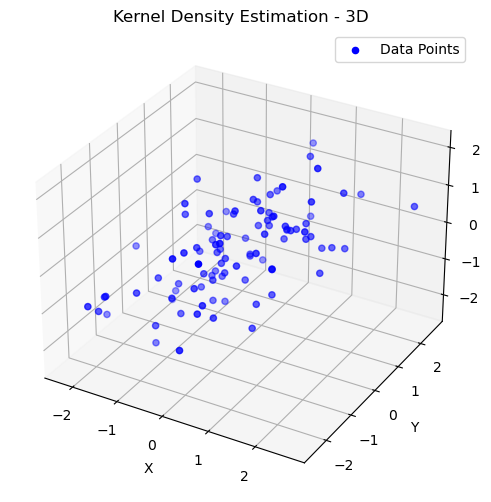

In [64]:
# Create 3D sample data
data_3d = np.random.multivariate_normal(mean=[0, 0, 0], cov=[[1, 0.5, 0.5], [0.5, 1, 0.5], [0.5, 0.5, 1]], size=100)

from mpl_toolkits.mplot3d import Axes3D

kde_3d = KernelDensityEstimation(kernel='gaussian')

kde_3d.fit(data_3d)

def visualize_3d_pdf(data):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    x, y, z = np.meshgrid(np.linspace(min(data[:, 0]), max(data[:, 0]), 50),
                          np.linspace(min(data[:, 1]), max(data[:, 1]), 50),
                          np.linspace(min(data[:, 2]), max(data[:, 2]), 50))

    points = np.vstack([x.ravel(), y.ravel(), z.ravel()]).T
    density = kde_3d.evaluate_density(points)

    density = density.reshape(x.shape)

    ax.scatter(data[:, 0], data[:, 1], data[:, 2], c='b', marker='o', label='Data Points')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax.set_title('Kernel Density Estimation - 3D')
    ax.legend()
    plt.show()

visualize_3d_pdf(data_3d)

## Task 2

In [7]:
def visualize_bboxes(img, df):
  img_2 = img.copy()
  for index, rows in df.iterrows():
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

  plt.imshow(img_2)

In [8]:
img = cv2.imread('./para_texts/images/159.jpg')
df = pd.read_csv('./para_texts/CSV/TLBR_159.csv')

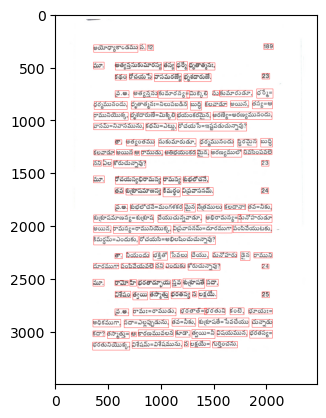

In [9]:
visualize_bboxes(img, df)

In [10]:
bounding_boxes_df = df.copy()

bounding_boxes_df.drop('Unnamed: 0', axis=1, inplace=True)
bounding_boxes_df.drop('Id', axis=1, inplace=True)


bounding_boxes_df['Top-Left'] = bounding_boxes_df['Top-Left'].apply(lambda x: eval(x))
bounding_boxes_df['Bottom-Right'] = bounding_boxes_df['Bottom-Right'].apply(lambda x: eval(x))

def calculate_center(row):
    top_left = row['Top-Left']
    bottom_right = row['Bottom-Right']
    
    center_x = (top_left[0] + bottom_right[0]) / 2
    center_y = (top_left[1] + bottom_right[1]) / 2
    
    return (center_x, center_y)

# Calculating centers
bounding_boxes_df['Center'] = bounding_boxes_df.apply(calculate_center, axis=1)
bounding_boxes_df

,Top-Left,Bottom-Right,Center
0,"[365, 291]","[783, 362]","(574.0, 326.5)"
1,"[802, 284]","[858, 342]","(830.0, 313.0)"
2,"[873, 291]","[931, 345]","(902.0, 318.0)"
3,"[1972, 280]","[2062, 335]","(2017.0, 307.5)"
4,"[363, 455]","[464, 520]","(413.5, 487.5)"
...,...,...,...
124,"[355, 3104]","[706, 3179]","(530.5, 3141.5)"
125,"[728, 3090]","[1201, 3162]","(964.5, 3126.0)"
126,"[1221, 3093]","[1259, 3148]","(1240.0, 3120.5)"
127,"[1279, 3090]","[1465, 3155]","(1372.0, 3122.5)"


In [11]:
from scipy.spatial.distance import cdist

def get_hor_and_vert_dists(bounding_boxes_df, num_neighbours = None):
    if num_neighbours is None:
        num_neighbours = 6

    vertical_distances, horizontal_distances = [], []

    for _, row in bounding_boxes_df.iterrows():
        
        center = np.array(row['Center'])

        left1, top1 =  row['Top-Left']
        right1, bottom1 = row['Bottom-Right']

        distances = cdist(np.array([center]), bounding_boxes_df['Center'].tolist(), metric='euclidean')[0]

        closest_inds = np.argsort(distances)[1:num_neighbours+1]

        for i in closest_inds:
            neigh_row = bounding_boxes_df.iloc[i]

            left2, top2 =  neigh_row['Top-Left']
            right2, bottom2 = neigh_row['Bottom-Right']

            ver_dist = min(
                abs(top2 - bottom1),
                abs(top2 - top1),
                abs(bottom2 - bottom1),
                abs(bottom2 - top1)
            )
            hor_dist = min(
                abs(right2 - left1),
                abs(right2 - right1),
                abs(left2 - left1),
                abs(left2 - right1)
            )

            horizontal_distances.append(hor_dist)
            vertical_distances.append(ver_dist)    

    vertical_distances = np.array(vertical_distances)
    horizontal_distances = np.array(horizontal_distances)

    return horizontal_distances, vertical_distances

horizontal_distances, vertical_distances = get_hor_and_vert_dists(bounding_boxes_df)

In [12]:
vertical_distances.shape, horizontal_distances.shape

((774,), (774,))



						 -------------- Kernel: box --------------

		 -------------- Horizontal Bandwith: 15 Vertical Bandwidith: 10 --------------
		 Image: 159
15 10


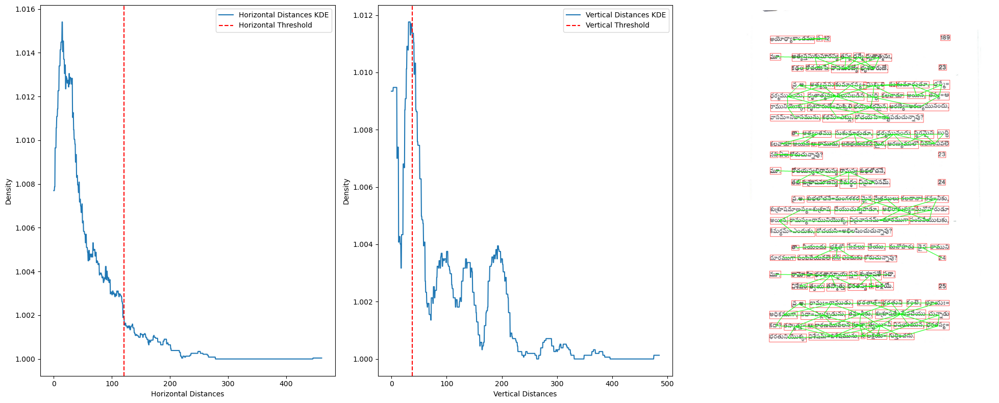

		 Image: 29
15 10


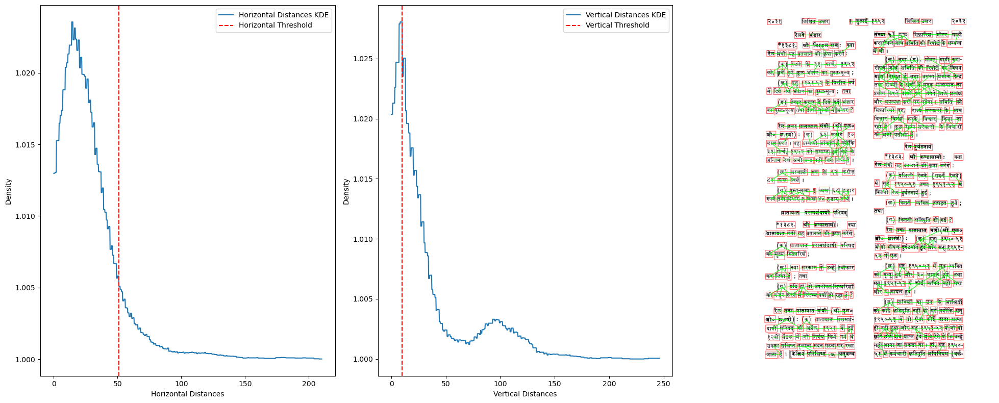

		 Image: 174
15 10


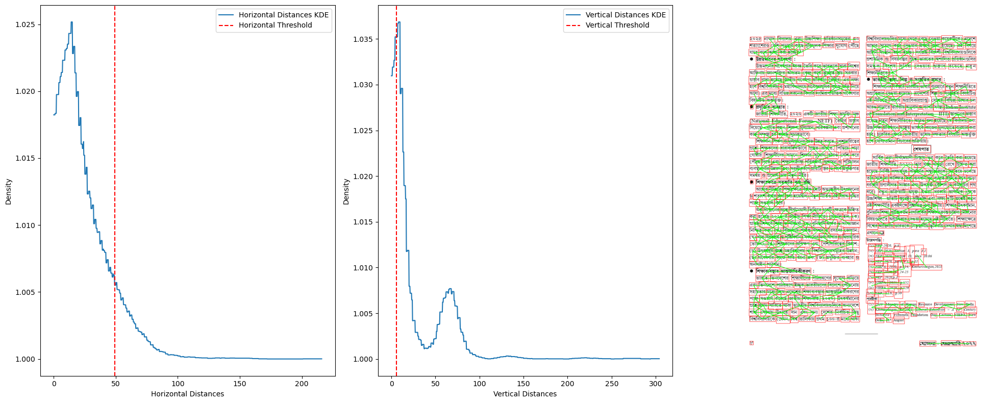

		 Image: 101
15 10


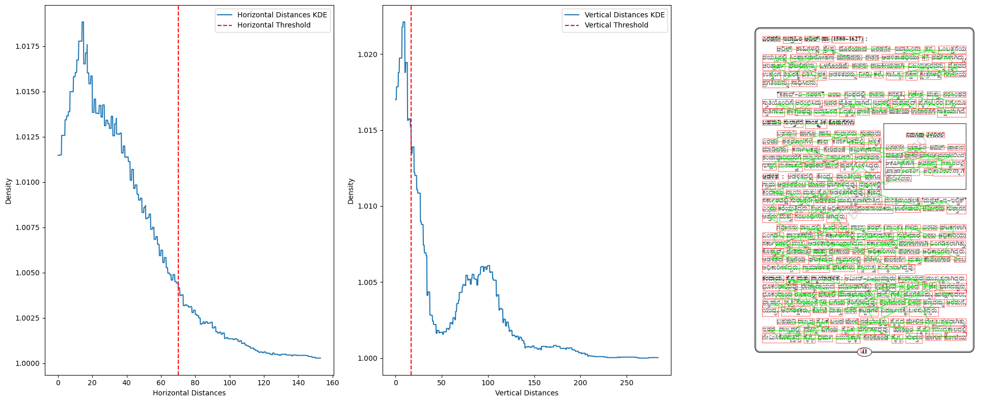

In [22]:
def visualize_kde_threshold(img, bounding_boxes_df, distances_h, distances_v, threshold_h, threshold_v, bandwidth_h = None, bandwidth_v = None, kernel = None):
    
    if kernel is None:
        kernel = 'gaussian'
    
    plt.figure(figsize=(20, 8))
    plt.subplot(1, 3, 1)
    kde_h = KernelDensityEstimation(kernel=kernel)
    kde_h.fit(np.array(distances_h).reshape(-1, 1))

    if bandwidth_h is not None:
        kde_h.bandwidth = bandwidth_h

    x_h = np.linspace(min(distances_h), max(distances_h), 1000).reshape(-1, 1)
    density_h = np.exp(kde_h.evaluate_density(x_h))
    plt.plot(x_h, density_h, label='Horizontal Distances KDE')
    plt.axvline(x=threshold_h, color='r', linestyle='--', label='Horizontal Threshold')
    plt.xlabel('Horizontal Distances')
    plt.ylabel('Density')
    plt.legend()


    plt.subplot(1, 3, 2)
    kde_v = KernelDensityEstimation(kernel=kernel)
    kde_v.fit(np.array(distances_v).reshape(-1, 1))

    if bandwidth_v is not None:
        kde_v.bandwidth = bandwidth_v

    x_v = np.linspace(min(distances_v), max(distances_v), 1000).reshape(-1, 1)
    density_v = np.exp(kde_v.evaluate_density(x_v))
    plt.plot(x_v, density_v, label='Vertical Distances KDE')
    plt.axvline(x=threshold_v, color='r', linestyle='--', label='Vertical Threshold')
    plt.xlabel('Vertical Distances')
    plt.ylabel('Density')
    plt.legend()


    plt.subplot(1, 3, 3)

    img_2 = img.copy()
    for i, row1 in bounding_boxes_df.iterrows():

        cv2.rectangle(img_2, row1['Top-Left'], row1['Bottom-Right'], (255, 0, 0), 2)

        for j, row2 in bounding_boxes_df.iterrows():

            if i != j:
                
                center1 = np.array(row1['Center'])
                center2 = np.array(row2['Center'])
                center_int1 = center1.astype(int)
                center_int2 = center2.astype(int)

                left1, top1 =  row1['Top-Left']
                right1, bottom1 = row1['Bottom-Right']

                left2, top2 =  row2['Top-Left']
                right2, bottom2 = row2['Bottom-Right']

                ver_dist = min(
                    abs(top2 - bottom1),
                    abs(top2 - top1),
                    abs(bottom2 - bottom1),
                    abs(bottom2 - top1)
                )
                hor_dist = min(
                    abs(right2 - left1),
                    abs(right2 - right1),
                    abs(left2 - left1),
                    abs(left2 - right1)
                )

                if hor_dist <= threshold_h and ver_dist <= threshold_v:
                     cv2.line(img_2, center_int1, center_int2, (0, 255, 0), 4)
    plt.imshow(img_2)

    plt.axis('off')
    plt.tight_layout()
    plt.show()

def process_bounding_df(df):
    bounding_boxes_df = df.copy()

    bounding_boxes_df.drop('Unnamed: 0', axis=1, inplace=True)
    bounding_boxes_df.drop('Id', axis=1, inplace=True)


    bounding_boxes_df['Top-Left'] = bounding_boxes_df['Top-Left'].apply(lambda x: eval(x))
    bounding_boxes_df['Bottom-Right'] = bounding_boxes_df['Bottom-Right'].apply(lambda x: eval(x))

    def calculate_center(row):
        top_left = row['Top-Left']
        bottom_right = row['Bottom-Right']
        
        center_x = (top_left[0] + bottom_right[0]) / 2
        center_y = (top_left[1] + bottom_right[1]) / 2
        
        return (center_x, center_y)
    bounding_boxes_df['Center'] = bounding_boxes_df.apply(calculate_center, axis=1)

    return bounding_boxes_df

# for kernel in ['gaussian', 'triangular', 'box']:
#     print(f"\n\n\t\t\t\t\t\t -------------- Kernel: {kernel} --------------")
#     for bandwidth_h in [5, 10, 15, 20]:
#         for bandwidth_v in [5, 10, 15, 20]:

'''
    *********NOTE*********

    Adding truncated tuning results only as all the tuning exceeded GitHub's limit of 100MB
'''

for kernel in ['box']:
    print(f"\n\n\t\t\t\t\t\t -------------- Kernel: {kernel} --------------")
    for bandwidth_h in [15]:
        for bandwidth_v in [10]:

            print(f"\n\t\t -------------- Horizontal Bandwith: {bandwidth_h} Vertical Bandwidith: {bandwidth_v} --------------")
            
            for img_name in ['159', '29', '174', '101']:

                print(f"\t\t Image: {img_name}")

                img = cv2.imread(f'./para_texts/images/{img_name}.jpg')
                df = pd.read_csv(f'./para_texts/CSV/TLBR_{img_name}.csv')

                bounding_boxes_df = process_bounding_df(df)
                horizontal_distances, vertical_distances = get_hor_and_vert_dists(bounding_boxes_df)

                h_perc, v_perc = 90, 40

                kde_h = KernelDensityEstimation(kernel=kernel)
                kde_v = KernelDensityEstimation(kernel=kernel)

                kde_h.fit(horizontal_distances)
                kde_v.fit(vertical_distances)

                kde_h.bandwidth = bandwidth_h
                kde_v.bandwidth = bandwidth_v

                print(kde_h.bandwidth, kde_v.bandwidth)

                threshold_h = np.percentile(horizontal_distances, h_perc)
                threshold_v = np.percentile(vertical_distances, v_perc)

                visualize_kde_threshold(img, bounding_boxes_df, horizontal_distances, vertical_distances, threshold_h, threshold_v, bandwidth_h, bandwidth_v, kernel)

The best things are - 

    kernel: box
    horizontal bandwidth: 15
    vertical bandwith: 10

In [16]:
test_images = [
    29, 68, 145, 201, 232, 250
]

In [17]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import fcluster

def opt_thresh(center_points):
    tuned_centers = np.copy(center_points)

    scaler = StandardScaler()
    tuned_centers = scaler.fit_transform(tuned_centers)

    tuned_centers[:, 1] *= 5
    
    linkage_matrix = linkage(tuned_centers, method='single')
    
    min_num, max_num = 5, 300
    
    cur_thresh = 0
    
    for threshold in range(min_num, max_num):
        cur_thresh = threshold/100
        
        clusters = fcluster(linkage_matrix, cur_thresh, criterion='distance')

        clusters_dict = {}
        
        for i, cluster in enumerate(clusters):
            if cluster not in clusters_dict:
                clusters_dict[cluster] = []  
            clusters_dict[cluster].append(i)
            
        avg_distance = 0
        max_intra_cluster_distance = -1
        
        for cluster in clusters_dict:
            
            cur_dist = 0
            cur_list = clusters_dict[cluster]
            
            if len(cur_list) == 1:
                continue
            
            for i in range(0, len(cur_list)):
                closest_neighs = 12
                cur_nns = []
                for j in range(0, len(cur_list)):
                    if i != j:
                        cur_i_point = center_points[cur_list[i]]
                        cur_j_point = center_points[cur_list[j]]

                        bw_point_dist = np.sqrt((cur_i_point[0] - cur_j_point[0])**2 + (cur_i_point[1] - cur_j_point[1])**2)

                        cur_nns.append(bw_point_dist)
                
                cur_nns.sort()
                
            cur_nns = cur_nns[:min(len(cur_nns), closest_neighs)]
            
            cur_dist = sum(cur_nns)/len(cur_nns)
            
            avg_distance += cur_dist
            
            if cur_nns[-1] > max_intra_cluster_distance:
                max_intra_cluster_distance = cur_nns[-1]
            
            
        avg_distance /= len(clusters_dict)

        if avg_distance * 5 > max_intra_cluster_distance and avg_distance < max_intra_cluster_distance:
            break
        
    return fcluster(linkage_matrix, cur_thresh, criterion='distance')

## RESULTS

NOTE: I have drawn line between a word and its surrounding words that belong to the same paragraph using KDE. This is why it might not look clean but the paragraphs are clearly detected.

Here - connected words represent a paragraph

		 --------- Image: 29 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


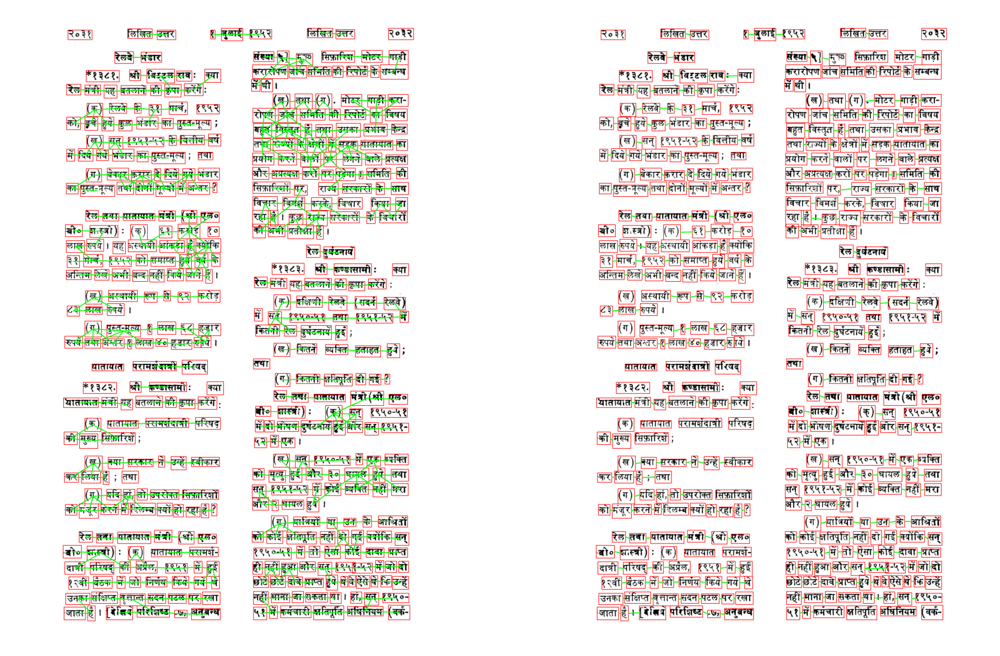

		 --------- Image: 68 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


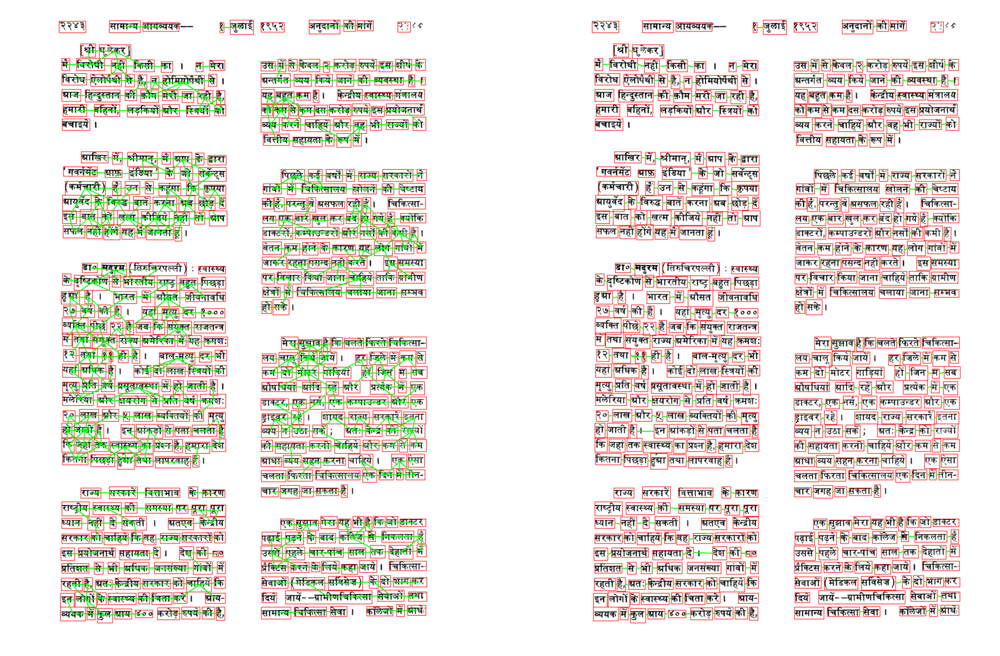

		 --------- Image: 145 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


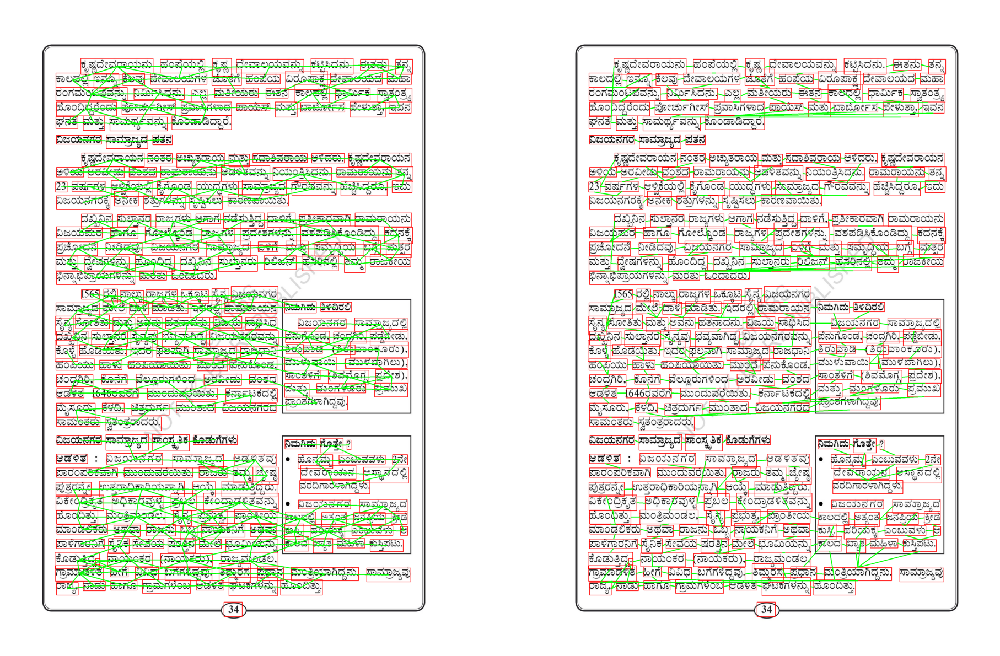

		 --------- Image: 201 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


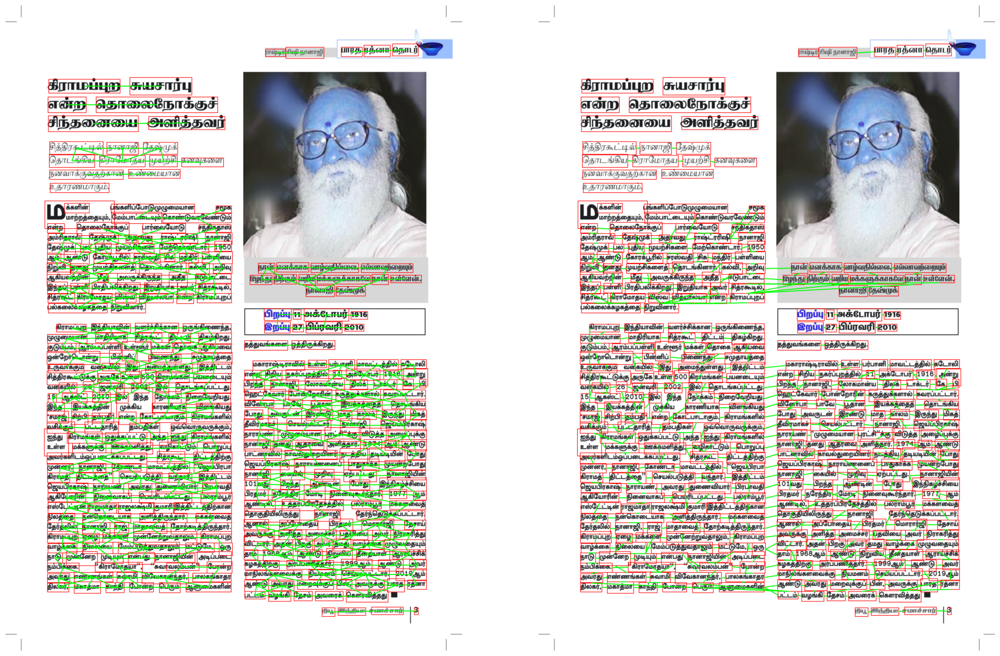

		 --------- Image: 232 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


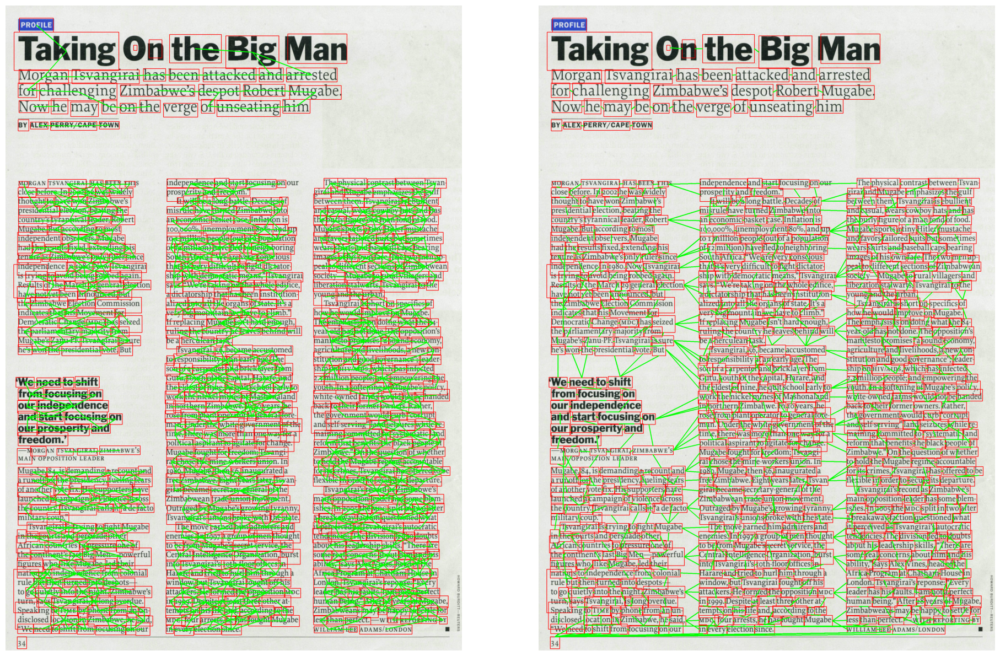

		 --------- Image: 250 ---------
		 --------- KDE --------- 	 	 	 	 	 	 	 	 	 --------- GMM ---------


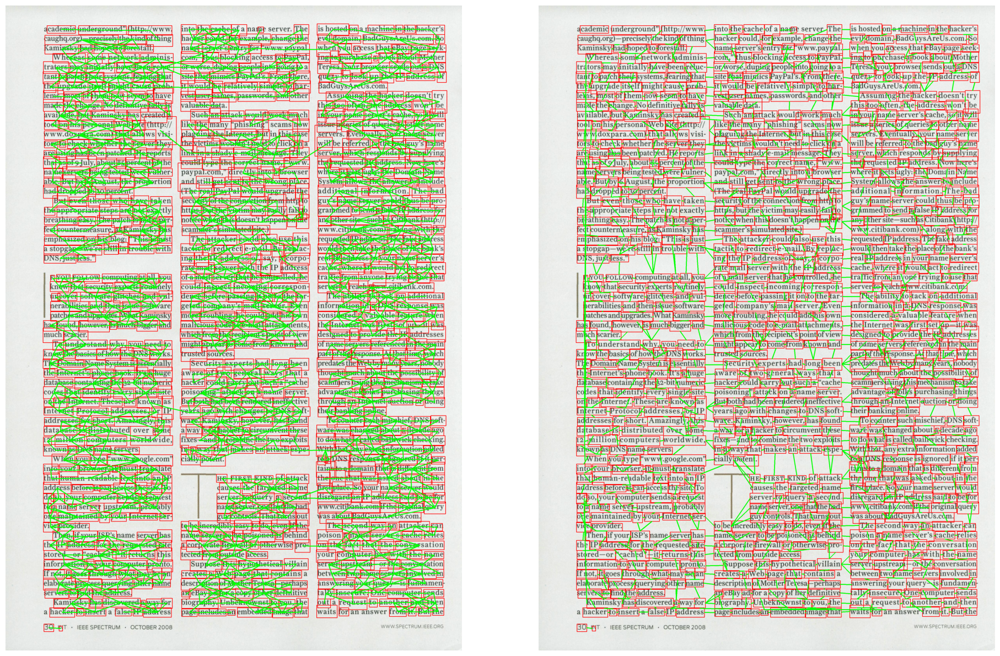

In [20]:
for img_name in test_images:
    
    print(f"\t\t --------- Image: {img_name} ---------")
    print(f"\t\t --------- KDE --------- \t \t \t \t \t \t \t \t \t --------- GMM ---------")

    bandwidth_h, bandwidth_v = 15, 10
    kernel = 'box'

    img = cv2.imread(f'./para_texts/images/{img_name}.jpg')
    df = pd.read_csv(f'./para_texts/CSV/TLBR_{img_name}.csv')

    bounding_boxes_df = process_bounding_df(df)
    horizontal_distances, vertical_distances = get_hor_and_vert_dists(bounding_boxes_df)

    h_perc, v_perc = 88, 40

    kde_h = KernelDensityEstimation(kernel=kernel)
    kde_v = KernelDensityEstimation(kernel=kernel)

    kde_h.fit(horizontal_distances)
    kde_v.fit(vertical_distances)

    kde_h.bandwidth = bandwidth_h
    kde_v.bandwidth = bandwidth_v

    threshold_h = np.percentile(horizontal_distances, h_perc)
    threshold_v = np.percentile(vertical_distances, v_perc)

    plt.figure(figsize=(20, 12))

    plt.subplot(1, 2, 1)
    img_2 = img.copy()
    for i, row1 in bounding_boxes_df.iterrows():

        cv2.rectangle(img_2, row1['Top-Left'], row1['Bottom-Right'], (255, 0, 0), 2)

        for j, row2 in bounding_boxes_df.iterrows():

            if i != j:
                
                center1 = np.array(row1['Center'])
                center2 = np.array(row2['Center'])
                center_int1 = center1.astype(int)
                center_int2 = center2.astype(int)

                left1, top1 =  row1['Top-Left']
                right1, bottom1 = row1['Bottom-Right']

                left2, top2 =  row2['Top-Left']
                right2, bottom2 = row2['Bottom-Right']

                ver_dist = min(
                    abs(top2 - bottom1),
                    abs(top2 - top1),
                    abs(bottom2 - bottom1),
                    abs(bottom2 - top1)
                )
                hor_dist = min(
                    abs(right2 - left1),
                    abs(right2 - right1),
                    abs(left2 - left1),
                    abs(left2 - right1)
                )

                if hor_dist <= threshold_h and ver_dist <= threshold_v:
                     cv2.line(img_2, center_int1, center_int2, (0, 255, 0), 4)
    plt.imshow(img_2)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    

    center_points = []

    corners = []

    for index, rows in df.iterrows():
        top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
        bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
            
        center_points.append([(top_left[0] + bottom_right[0])//2, (top_left[1] + bottom_right[1])//2])
            
        corners.append([top_left[0], bottom_right[0], top_left[1], bottom_right[1]])
        
    center_points = np.array(center_points)

    clusters = opt_thresh(center_points)

    mid_pt_size = 15

    img_2 = img.copy()

    for i in range(len(center_points)): 
        
        # adding bounding box - corners is l, r, t, b
        top_left = (corners[i][0], corners[i][2])
        bottom_right = (corners[i][1], corners[i][3])
        cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)
        
    cluster_dict = {}
    for i in np.unique(clusters):
        cluster_dict[i] = []
        
    for i in range(len(center_points)):
        cluster_dict[clusters[i]].append(i)
        
    for cluster in cluster_dict:
        for i in cluster_dict[cluster]:
            
            left_adj_pt, left_adj_dist = None, 1e9
            # right_adj_pt, right_adj_dist = None, 1e9
            # bot_adj_pt, bot_adj_dist = None, 1e9
            top_adj_pt, top_adj_dist = None, 1e9
            
            for j in cluster_dict[cluster]:
                # left adjacent - it's right should be <= left
                if corners[j][1] <= corners[i][0] and i != j:
                    
                    cur_dist = np.sqrt((corners[i][0] - corners[j][1])**2 + ((corners[j][2] + corners[j][3])/2 - (corners[i][2] + corners[i][3])/2)**2)
                                    
                    if cur_dist < left_adj_dist:
                        left_adj_dist = cur_dist
                        left_adj_pt = (corners[j][1], int((corners[j][2] + corners[j][3])/2))
                        
                # top adjacent - it's bottom should be >= top
                if corners[j][2] >= corners[i][3] and i != j:
                    cur_dist = np.sqrt((corners[j][2] - corners[i][3])**2 + ((corners[j][0] + corners[j][1])/2 - (corners[i][0] + corners[i][1])/2)**2)

                    if cur_dist < top_adj_dist:
                        top_adj_dist = cur_dist
                        top_adj_pt = (int((corners[j][0] + corners[j][1])/2), corners[j][2])
                        
            
            if left_adj_pt is not None:
                cv2.line(img_2, left_adj_pt, (corners[i][0], int((corners[i][2] + corners[i][3])/2)), (0, 255, 0), 4)

            if top_adj_pt is not None:
                cv2.line(img_2, top_adj_pt, (int((corners[i][0] + corners[i][1])/2), corners[i][3]), (0, 255, 0), 4)

    plt.imshow(img_2)


    plt.axis('off')
    plt.tight_layout()
    plt.show()

    